## Import libraries

In [369]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import LabelEncoder

# import chardet

## Load data

In [370]:
# with open('spotify_songs.csv', 'rb') as f:
#     result = chardet.detect(f.read())
#     print(result)

In [371]:
# df = pd.read_csv("./spotify_songs.csv", on_bad_lines='skip', encoding='ISO-8859-1', sep=';') # Windows-1254
# df.head()

In [372]:
df = pd.read_csv("./spotify_songs.csv")
df.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [373]:
df.shape

(32833, 23)

## EDA

In [374]:
df.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms'],
      dtype='object')

In [375]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [376]:
df.isnull().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

### Traiter les NaN

In [377]:
index_nan = df[df.isnull().any(axis=1)].index

In [378]:
index_nan

Int64Index([8151, 9282, 9283, 19568, 19811], dtype='int64')

In [379]:
df.loc[index_nan]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
8151,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,HIP&HOP,5DyJsJZOpMJh34WvUrQzMV,rap,...,6,-7.635,1,0.1760,0.0410,0.00000,0.1160,0.649,95.999,282707
9282,5cjecvX0CmC9gK0Laf5EMQ,NaN,NaN,0,3luHJEPw434tvNbme3SP8M,NaN,2017-12-01,GANGSTA Rap,5GA8GDo7RQC3JEanT81B3g,rap,...,11,-5.364,0,0.3190,0.0534,0.00000,0.5530,0.191,146.153,202235
9283,5TTzhRSWQS4Yu8xTgAuq6D,NaN,NaN,0,3luHJEPw434tvNbme3SP8M,NaN,2017-12-01,GANGSTA Rap,5GA8GDo7RQC3JEanT81B3g,rap,...,10,-5.907,0,0.3070,0.0963,0.00000,0.0888,0.505,86.839,206465
19568,3VKFip3OdAvv4OfNTgFWeQ,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,Reggaeton viejito🔥,0si5tw70PIgPkY1Eva6V8f,latin,...,11,-6.075,0,0.0366,0.0606,0.00653,0.1030,0.726,97.017,252773
19811,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,latin hip hop,3nH8aytdqNeRbcRCg3dw9q,latin,...,6,-7.635,1,0.1760,0.0410,0.00000,0.1160,0.649,95.999,282707


In [380]:
# vérifier si un track id
result = df[df['track_id'] == '69gRFGOWY9OMpFJgFol1u0']
result

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
8151,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,HIP&HOP,5DyJsJZOpMJh34WvUrQzMV,rap,...,6,-7.635,1,0.176,0.041,0.0,0.116,0.649,95.999,282707
19811,69gRFGOWY9OMpFJgFol1u0,NaN,NaN,0,717UG2du6utFe7CdmpuUe3,NaN,2012-01-05,latin hip hop,3nH8aytdqNeRbcRCg3dw9q,latin,...,6,-7.635,1,0.176,0.041,0.0,0.116,0.649,95.999,282707


In [381]:
data = df.dropna()
data.shape

(32828, 23)

### Exploration des données

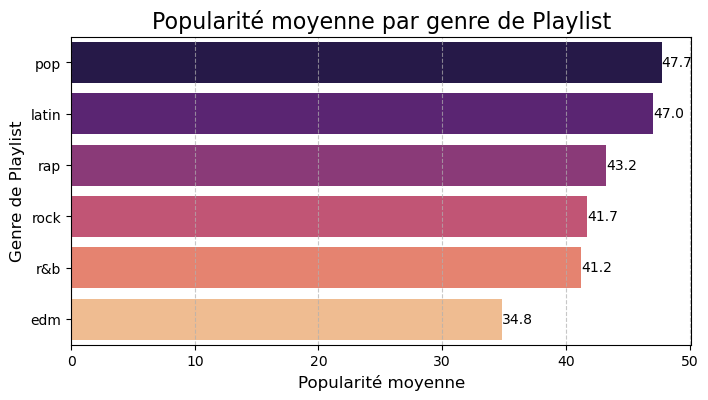

In [382]:
# Popularité moyenne par genre de playlist, triée par ordre décroissant
playlist_popularity = data.groupby('playlist_genre')['track_popularity'].mean().sort_values(ascending=False)

# Traçage avec améliorations
plt.figure(figsize=(8, 4))
sns.barplot(x=playlist_popularity.values, y=playlist_popularity.index, palette='magma')

# Exploration des données
for index, value in enumerate(playlist_popularity.values):
    plt.text(value, index, f'{value:.1f}', va='center', ha='left', color='black')

# Amélioration de la lisibilité
plt.title('Popularité moyenne par genre de Playlist', fontsize=16)
plt.xlabel('Popularité moyenne', fontsize=12)
plt.ylabel('Genre de Playlist', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Ajout de lignes de grille pour comparaison
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.show()

In [383]:
plot_df = data.copy()
plot_df.columns = plot_df.columns.str.replace("_", " ").str.title()

fig = px.parallel_coordinates(
    pd.concat([plot_df.select_dtypes(float), plot_df['Track Popularity']], axis=1), 
    color="Track Popularity", 
    color_continuous_scale=px.colors.diverging.Spectral, 
    color_continuous_midpoint=5,
    labels={'Track Popularity': 'Popularité'},
)
fig.update_layout(
    title={
        'text': "Popularité par rapport aux caractéristiques",
        'x': 0.5,
        'y': 0.99,
        'xanchor': 'center'
    },
    margin=dict(t=80)
)
fig.show()

In [384]:
plot_df[['Playlist Genre', 'Playlist Subgenre']] = plot_df[['Playlist Genre', 'Playlist Subgenre']] \
                                                  .apply(lambda x: x.str.capitalize(), axis=1)

fig = px.sunburst(
    plot_df,
    path=['Playlist Genre', 'Playlist Subgenre'], 
    color='Track Popularity', 
    color_continuous_scale=['blue', 'purple', 'orange', 'yellow'], 
    labels={'Track Popularity': 'Popularité'},
)

fig.update_traces(
    hovertemplate="<b>%{label}</b><br><br>Nombre=%{value}<br>Popularité=%{color:.2f}<extra></extra>"
)

fig.update_layout(
    title={
        'text':"Popularité des genres et sous-genres",
        'x': 0.47,
        'y': 0.95,
        'xanchor': 'center'
    },
    margin=dict(t=70)
)

fig.show()

In [385]:
fig = px.treemap(
    plot_df.groupby(['Track Artist', 'Track Name'])['Track Popularity'].mean().sort_values(ascending=False).reset_index()[:100],
    path=[px.Constant("Artists"), 'Track Artist', 'Track Name'], 
    values='Track Popularity',
    color_discrete_sequence=px.colors.diverging.Portland,
    labels={'Track Popularity': 'Popularity'},
)
fig.update_traces(
    hovertemplate="<b>%{label}</b><br><br>Popularity=%{value:.2f}<extra></extra>"
)
fig.update_layout(
    title={
        'text':"Titres les plus populaires par artiste",
        'x': 0.5,
        'y': 0.95,
        'xanchor': 'center'
    },
    margin=dict(t=70)
)
fig.show()

C:\Users\Oussama\AppData\Local\Temp\ipykernel_1800\3802675224.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



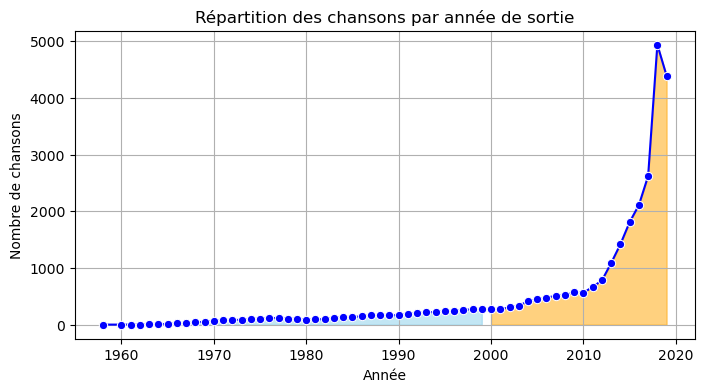

In [386]:
# Extraction de l'année de sortie des chansons
data['year'] = pd.to_datetime(data['track_album_release_date'], errors='coerce').dt.year
yearly_tracks = data['year'].value_counts().sort_index()
yearly_tracks = yearly_tracks[yearly_tracks.index <= 2024]  # Inclure les données jusqu'en 2024
yearly_tracks_smoothed = yearly_tracks.rolling(window=3, center=True).mean()

# Tracé de la tendance lissée avec annotations et code couleur
plt.figure(figsize=(8, 4))
sns.lineplot(x=yearly_tracks_smoothed.index, y=yearly_tracks_smoothed.values, marker='o', color='blue')
plt.title('Répartition des chansons par année de sortie')
plt.xlabel('Année')
plt.ylabel('Nombre de chansons')
plt.grid(True)

# Ajout d'annotations pour les points clés
max_year = yearly_tracks.idxmax()
max_value = yearly_tracks.max()
plt.annotate(f'Maximum en {max_year}', xy=(max_year, max_value), xytext=(max_year-10, max_value + 500),
             arrowprops=dict(facecolor='black', arrowstyle="->"))

# Code couleur pour différentes époques
plt.fill_between(yearly_tracks_smoothed.index, yearly_tracks_smoothed.values, where=yearly_tracks_smoothed.index < 2000, color='skyblue', alpha=0.5)
plt.fill_between(yearly_tracks_smoothed.index, yearly_tracks_smoothed.values, where=yearly_tracks_smoothed.index >= 2000, color='orange', alpha=0.5)

plt.show()

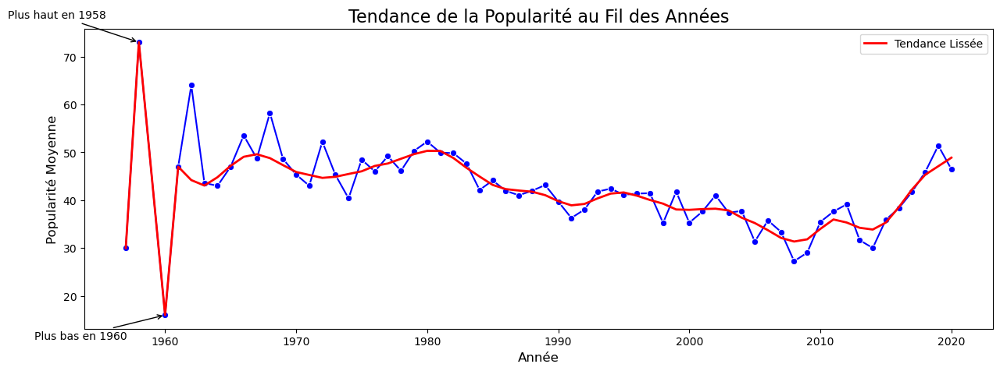

In [387]:
from statsmodels.nonparametric.smoothers_lowess import lowess

# Calculer la popularité moyenne pour chaque année
yearly_popularity = data.groupby('year')['track_popularity'].mean()

# Calculer la tendance lissée
smoothed = lowess(yearly_popularity.values, yearly_popularity.index, frac=0.1)

plt.figure(figsize=(15, 5))
sns.lineplot(x=yearly_popularity.index, y=yearly_popularity.values, marker='o', color='blue')
plt.plot(smoothed[:, 0], smoothed[:, 1], color='red', lw=2, label='Tendance Lissée')
plt.title('Tendance de la Popularité au Fil des Années', fontsize=16)
plt.xlabel('Année', fontsize=12)
plt.ylabel('Popularité Moyenne', fontsize=12)

# Annotation du pic et du creux
max_year = yearly_popularity.idxmax()
max_value = yearly_popularity.max()
plt.annotate(f'Plus haut en {max_year}', xy=(max_year, max_value), xytext=(max_year-10, max_value+5),
             arrowprops=dict(facecolor='black', arrowstyle="->"))

min_year = yearly_popularity.idxmin()
min_value = yearly_popularity.min()
plt.annotate(f'Plus bas en {min_year}', xy=(min_year, min_value), xytext=(min_year-10, min_value-5),
             arrowprops=dict(facecolor='black', arrowstyle="->"))

plt.legend()
plt.show()

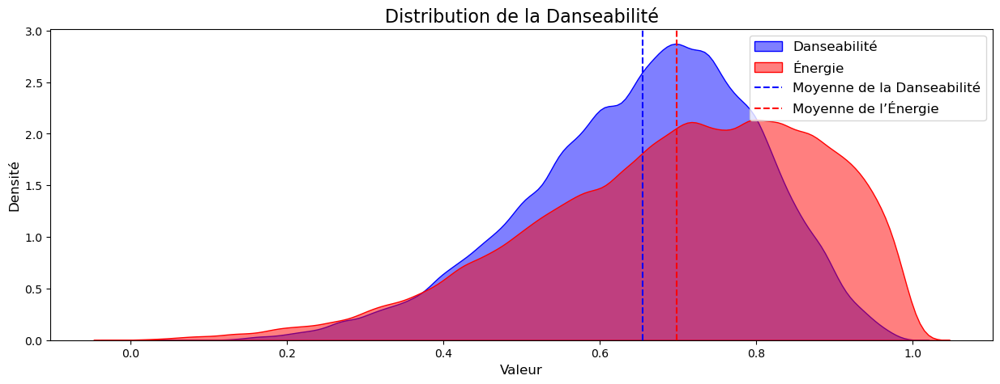

In [178]:
# Tracé de la distribution de la danseabilité
plt.figure(figsize=(15, 5))
sns.kdeplot(df['danceability'], shade=True, label='Danseabilité', color='blue', alpha=0.5, bw_adjust=0.7)
sns.kdeplot(df['energy'], shade=True, label='Énergie', color='red', alpha=0.5, bw_adjust=0.7)
plt.axvline(df['danceability'].mean(), color='blue', linestyle='--', label='Moyenne de la Danseabilité')
plt.axvline(df['energy'].mean(), color='red', linestyle='--', label='Moyenne de l’Énergie')
plt.title('Distribution de la Danseabilité', fontsize=16)
plt.xlabel('Valeur', fontsize=12)
plt.ylabel('Densité', fontsize=12)
plt.legend(fontsize=12)
plt.grid(False)
plt.show()

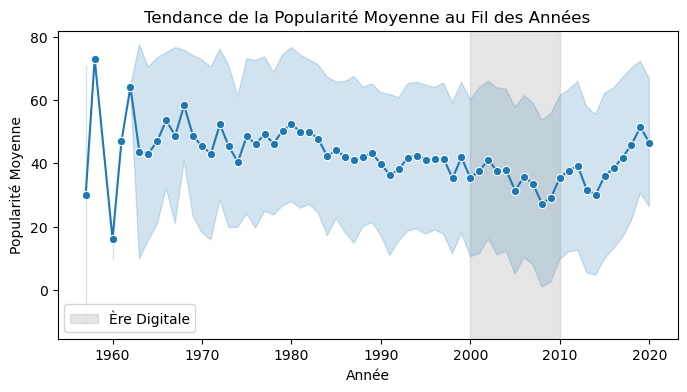

In [179]:
plt.figure(figsize=(8, 4))
sns.lineplot(x='year', y='track_popularity', data=data, ci='sd', marker='o')
plt.axvspan(2000, 2010, color='gray', alpha=0.2, label='Ère Digitale')
plt.title('Tendance de la Popularité Moyenne au Fil des Années')
plt.xlabel('Année')
plt.ylabel('Popularité Moyenne')
plt.legend()
plt.grid(False)
plt.show()

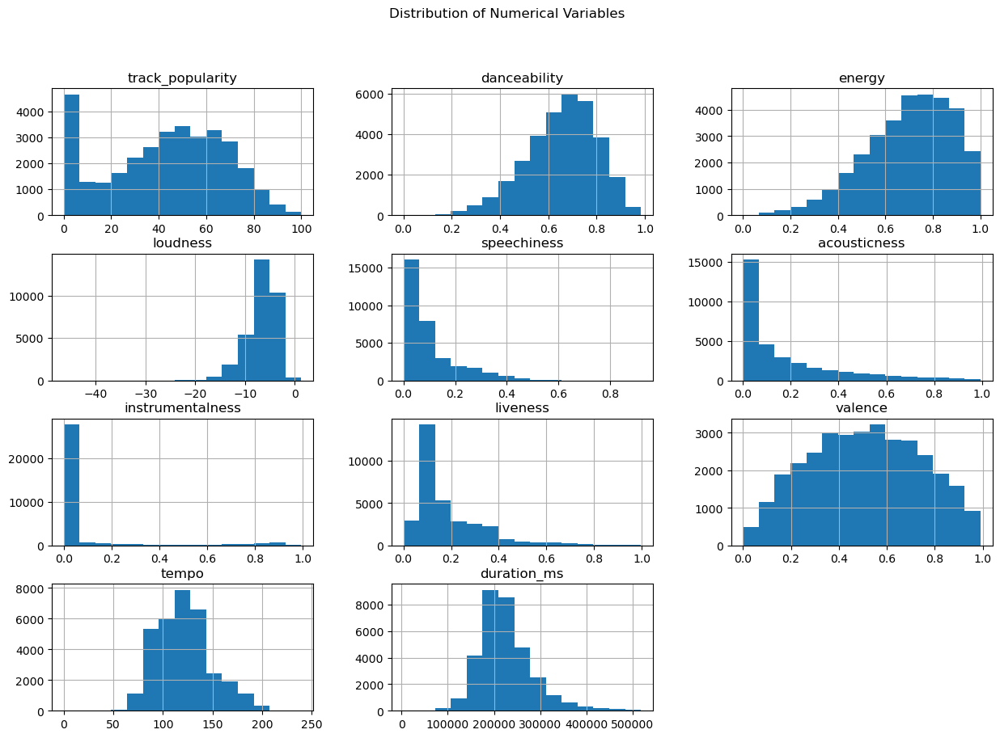


edm      6043
rap      5743
pop      5507
r&b      5431
latin    5153
rock     4951
Name: playlist_genre, dtype: int64

Martin Garrix                161
Queen                        136
The Chainsmokers             123
David Guetta                 110
Don Omar                     102
Drake                        100
Dimitri Vegas & Like Mike     93
Calvin Harris                 91
Hardwell                      84
Kygo                          83
Name: track_artist, dtype: int64


In [180]:
numerical_columns = ['track_popularity', 'danceability', 'energy', 'loudness', 'speechiness', 
                     'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

data[numerical_columns].hist(bins=15, figsize=(15, 10))
plt.suptitle('Distribution of Numerical Variables')
plt.show()

# Fréquence des variables catégorielles
print()
print(data['playlist_genre'].value_counts())

# Top 10 
print()
print(data['track_artist'].value_counts().head(10)) 

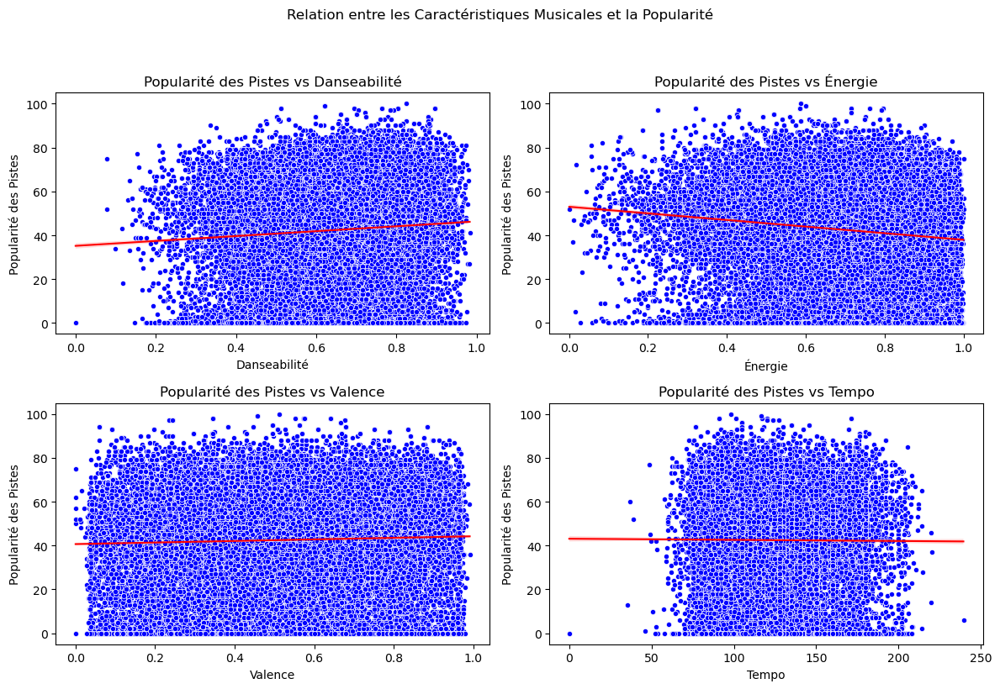

In [181]:
# Création du pairplot avec des diagrammes de dispersion en disposition 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # Créer une figure avec 2 lignes et 2 colonnes

# Liste des caractéristiques pour l'axe x et leur titre correspondant
features = ['danceability', 'energy', 'valence', 'tempo']
titles = ['Danseabilité', 'Énergie', 'Valence', 'Tempo']

# Ajout des diagrammes de dispersion avec lignes de régression pour chaque caractéristique
for i, (feature, title) in enumerate(zip(features, titles)):
    ax = axes[i // 2, i % 2]
    sns.scatterplot(x=feature, y='track_popularity', data=data, ax=ax, s=20, edgecolor='w', linewidth=0.5, color='blue')
    sns.regplot(x=feature, y='track_popularity', data=data, ax=ax, scatter=False, color='red', line_kws={'linewidth': 1.5})
    ax.set_title(f'Popularité des Pistes vs {title}')
    ax.set_xlabel(title)
    ax.set_ylabel('Popularité des Pistes')

# Ajustement du titre général pour la figure
plt.suptitle('Relation entre les Caractéristiques Musicales et la Popularité', y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.98])

# Affichage du graphique
plt.show()

### Calculate correlation matrix

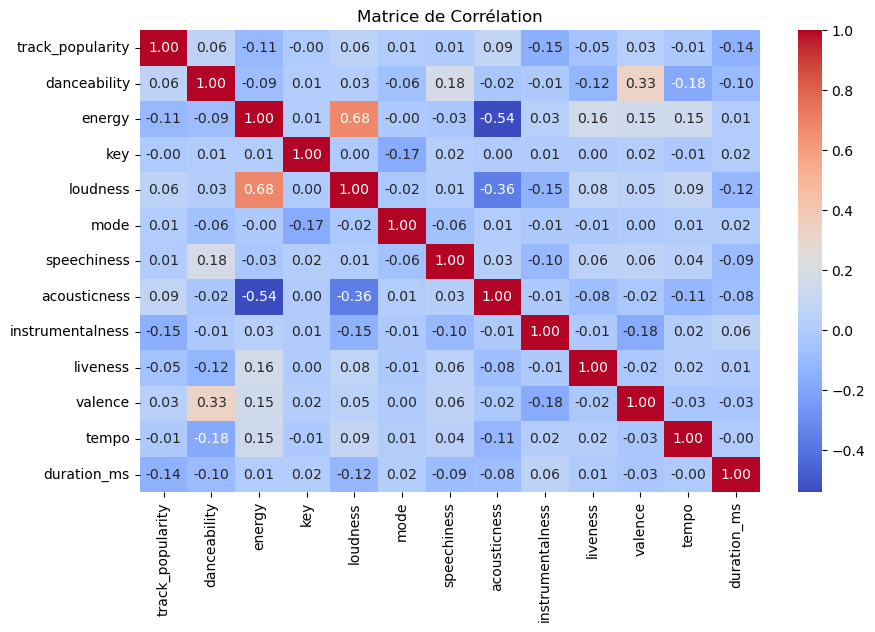

In [185]:
if 'year' in data.columns:
    data = data.drop(columns=['year'])
    
numeric_columns = data.select_dtypes(include=['float64', 'int64'])

# Calculate correlation matrix
correlation_matrix = numeric_columns.corr()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matrice de Corrélation")
plt.show()

### Isoler les tracks dupliqués

In [186]:
# nombre de tracks dupliquées
data.duplicated(subset=['track_name', 'track_artist']).value_counts()

False    26229
True      6599
dtype: int64

In [187]:
data.duplicated(subset=['track_id']).value_counts()

False    28352
True      4476
dtype: int64

In [188]:
len(data['track_name'].unique())

23449

In [189]:
# get tracks duplicated
dupes = data[data.duplicated(subset=['track_id'], keep='last')]
dupes.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
5,7fvUMiyapMsRRxr07cU8Ef,Beautiful People (feat. Khalid) - Jack Wins Remix,Ed Sheeran,67,2yiy9cd2QktrNvWC2EUi0k,Beautiful People (feat. Khalid) [Jack Wins Remix],2019-07-11,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,8,-5.385,1,0.1270,0.0799,0.000000,0.1430,0.585,124.982,163049
7,6b1RNvAcJjQH73eZO4BLAB,Post Malone (feat. RANI) - GATTÜSO Remix,Sam Feldt,69,6703SRPsLkS4bPtMFFJes1,Post Malone (feat. RANI) [GATTÜSO Remix],2019-08-29,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,4,-2.419,0,0.0434,0.0335,0.000005,0.1110,0.367,127.936,207619


In [190]:
dupes.shape

(4476, 23)

In [191]:
dupes['track_id'].value_counts()

7BKLCZ1jbUBVqRi2FVlTVw    9
14sOS5L36385FJ3OL8hew4    8
3eekarcy7kvN4yt5ZFzltW    8
3ZCTVFBt2Brf31RLEnCkWJ    7
6oJ6le65B3SEqPwMRNXWjY    7
                         ..
3jagJCUbdqhDSPuxP8cAqF    1
0NTMtAO2BV4tnGvw9EgBVq    1
6l4qV9VNeCOesvcLPJMO9y    1
33ZXjLCpiINn8eQIDYEPTD    1
2sApUgcQQL2m0quuYgq0ec    1
Name: track_id, Length: 3165, dtype: int64

### Tracks dataset to work on song's shape

In [192]:
data.shape

(32828, 23)

In [193]:
tracks_uniques = data.drop_duplicates(subset='track_id', keep='first')
tracks_uniques.shape

(28352, 23)

In [194]:
columns_to_keep = ['track_id','danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
tracks_for_clustering = tracks_uniques[columns_to_keep]
tracks_for_clustering

,track_id,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,6f807x0ima9a1j3VPbc7VN,0.748,0.916,-2.634,0.0583,0.102000,0.000000,0.0653,0.5180,122.036
1,0r7CVbZTWZgbTCYdfa2P31,0.726,0.815,-4.969,0.0373,0.072400,0.004210,0.3570,0.6930,99.972
2,1z1Hg7Vb0AhHDiEmnDE79l,0.675,0.931,-3.432,0.0742,0.079400,0.000023,0.1100,0.6130,124.008
3,75FpbthrwQmzHlBJLuGdC7,0.718,0.930,-3.778,0.1020,0.028700,0.000009,0.2040,0.2770,121.956
4,1e8PAfcKUYoKkxPhrHqw4x,0.650,0.833,-4.672,0.0359,0.080300,0.000000,0.0833,0.7250,123.976
...,...,...,...,...,...,...,...,...,...,...
32828,7bxnKAamR3snQ1VGLuVfC1,0.428,0.922,-1.814,0.0936,0.076600,0.000000,0.0668,0.2100,128.170
32829,5Aevni09Em4575077nkWHz,0.522,0.786,-4.462,0.0420,0.001710,0.004270,0.3750,0.4000,128.041
32830,7ImMqPP3Q1yfUHvsdn7wEo,0.529,0.821,-4.899,0.0481,0.108000,0.000001,0.1500,0.4360,127.989
32831,2m69mhnfQ1Oq6lGtXuYhgX,0.626,0.888,-3.361,0.1090,0.007920,0.127000,0.3430,0.3080,128.008


### Titres les plus utilisés

In [195]:
most_used_track_names = tracks_for_clustering['track_name'].value_counts()
most_used_track_names

6f807x0ima9a1j3VPbc7VN    1
5IVuqXILoxVWvWEPm82Jxr    1
4qRaZYiaOsSvWC7VgcxrI0    1
5aj0xPGiEUN3aI2oOYu14S    1
4TnUKixNWMfajncgdSwFoi    1
                         ..
7fXl3E41dDq3dfcC07VOgs    1
4etV43Qb0OBbMcxiLDVwSo    1
7gkHUletkecTClqfRLKboa    1
3wZGqsIjAMd9w0nrxG4xby    1
29zWqhca3zt5NsckZqDf6c    1
Name: track_id, Length: 28352, dtype: int64

In [196]:
most_used_track_names.shape

(28352,)

In [198]:
data.loc[df['track_id'] == '7BKLCZ1jbUBVqRi2FVlTVw']

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
133,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
1731,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Post pop teen,222nc9tKxKhfZ2GBrOpwH3,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
2478,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Electropop Hits 2017-2020,7kyvBmlc1uSqsTL0EuNLrx,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
4535,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,A Loose Definition of Indie Poptimism,4ZO0wp9G8FA3X6oYNBzda6,pop,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
7369,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,◤ Hip Hop Dance Music – Urban – Trap – Breakin...,0Hr2h94pKN8QAGVAgD6BsD,rap,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
17467,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Tropical House Run 190 BPM,37i9dQZF1DWSTc9FdySHtz,latin,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
18358,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,latin,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
19770,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,latin,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
23784,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,r&b,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
30629,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,2015 songs,6UJw1egIcZVfrBmcKs5uHH,edm,...,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960


In [199]:
data['track_album_release_date']

0        2019-06-14
1        2019-12-13
2        2019-07-05
3        2019-07-19
4        2019-03-05
            ...    
32828    2014-04-28
32829    2013-03-08
32830    2014-04-21
32831    2014-01-01
32832    2014-03-03
Name: track_album_release_date, Length: 32828, dtype: object

In [200]:
data.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


# Clustering

In [201]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA, TruncatedSVD, NMF
from sklearn.neighbors import NearestNeighbors

In [202]:
tracks_for_clustering = tracks_for_clustering.drop(df.columns[0], axis=1)
tracks_for_clustering

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.748,0.916,-2.634,0.0583,0.102000,0.000000,0.0653,0.5180,122.036
1,0.726,0.815,-4.969,0.0373,0.072400,0.004210,0.3570,0.6930,99.972
2,0.675,0.931,-3.432,0.0742,0.079400,0.000023,0.1100,0.6130,124.008
3,0.718,0.930,-3.778,0.1020,0.028700,0.000009,0.2040,0.2770,121.956
4,0.650,0.833,-4.672,0.0359,0.080300,0.000000,0.0833,0.7250,123.976
...,...,...,...,...,...,...,...,...,...
32828,0.428,0.922,-1.814,0.0936,0.076600,0.000000,0.0668,0.2100,128.170
32829,0.522,0.786,-4.462,0.0420,0.001710,0.004270,0.3750,0.4000,128.041
32830,0.529,0.821,-4.899,0.0481,0.108000,0.000001,0.1500,0.4360,127.989
32831,0.626,0.888,-3.361,0.1090,0.007920,0.127000,0.3430,0.3080,128.008


In [203]:
tracks_for_clustering.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000,28352.000000
mean,0.653375,0.698373,-6.817777,0.107939,0.177192,0.091129,0.190955,0.510386,120.958219
std,0.145791,0.183508,3.036433,0.102547,0.222814,0.232562,0.155888,0.234344,26.954502
min,0.000000,0.000175,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.561000,0.579000,-8.310250,0.041000,0.014300,0.000000,0.092600,0.329000,99.972000
50%,0.670000,0.722000,-6.261000,0.062600,0.079700,0.000021,0.127000,0.512000,121.993500
75%,0.760000,0.843000,-4.708750,0.133000,0.260000,0.006573,0.249000,0.695000,133.999000
max,0.983000,1.000000,1.275000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000


In [204]:
tracks_for_clustering.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28352 entries, 0 to 32832
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      28352 non-null  float64
 1   energy            28352 non-null  float64
 2   loudness          28352 non-null  float64
 3   speechiness       28352 non-null  float64
 4   acousticness      28352 non-null  float64
 5   instrumentalness  28352 non-null  float64
 6   liveness          28352 non-null  float64
 7   valence           28352 non-null  float64
 8   tempo             28352 non-null  float64
dtypes: float64(9)
memory usage: 2.2 MB


In [205]:
tracks_for_clustering = tracks_for_clustering.astype(float)

In [206]:
stdscaler = StandardScaler()
tracks_scaled = stdscaler.fit_transform(tracks_for_clustering)
tracks_scaled

array([[ 0.64905687,  1.18594815,  1.37788339, ..., -0.80607323,
         0.03249334,  0.03998589],
       [ 0.49815299,  0.63555461,  0.60887539, ...,  1.06517778,
         0.77927241, -0.77859311],
       [ 0.14833037,  1.26768976,  1.11507038, ..., -0.51932342,
         0.43788769,  0.1131475 ],
       ...,
       [-0.85312263,  0.66825125,  0.63192916, ..., -0.26272403,
        -0.31742599,  0.26084343],
       [-0.18777372,  1.0333638 ,  1.13845349, ...,  0.97536799,
        -0.86364154,  0.26154834],
       [-0.34553686,  1.01156604,  0.73995256, ...,  3.53494685,
        -1.79647527,  0.26065793]])

### PCA et SVD

In [207]:
pca = PCA(n_components=2)
tracks_pca = pca.fit_transform(tracks_scaled)
variance_explained_pca = pca.explained_variance_ratio_.sum()

In [208]:
svd = TruncatedSVD(n_components=2)
tracks_svd = svd.fit_transform(tracks_scaled)
variance_explained_svd = svd.explained_variance_ratio_.sum()

In [209]:
if variance_explained_pca >= variance_explained_svd:
    reduced_data = tracks_pca
    reduction_method = 'PCA'
else:
    reduced_data = tracks_svd
    reduction_method = 'SVD'

### K-Means

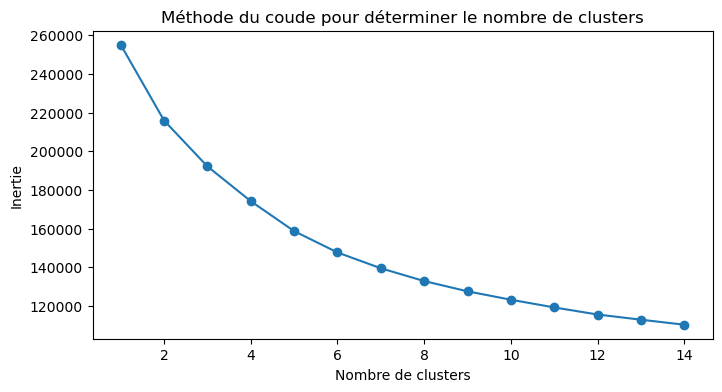

In [210]:
inertia = []
K = range(1, 15)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tracks_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(K, inertia, marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('Inertie')
plt.title('Méthode du coude pour déterminer le nombre de clusters')
plt.show()

In [211]:
kmeans = KMeans(n_clusters=6, random_state=42)
clusters_kmeans = kmeans.fit_predict(reduced_data)
tracks_uniques['Cluster_KMeans'] = clusters_kmeans
pca_silhouette = silhouette_score(tracks_pca, clusters_kmeans)
svd_silhouette = silhouette_score(tracks_svd, clusters_kmeans)

C:\Users\Oussama\AppData\Local\Temp\ipykernel_1800\24500290.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Score de silhouette pour PCA : 0.33


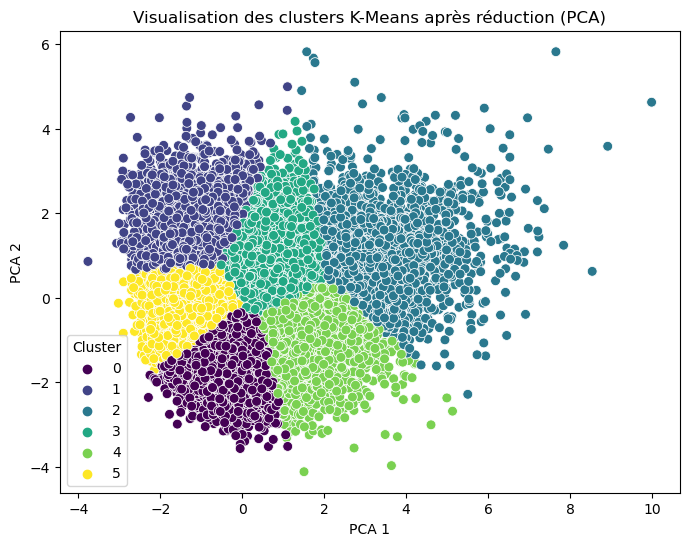

In [212]:
# Calcul du score de silhouette pour la qualité de séparation
silhouette_avg = silhouette_score(reduced_data, clusters_kmeans)
print(f"Score de silhouette pour {reduction_method} : {silhouette_avg:.2f}")

# Visualisation des clusters en 2D
plt.figure(figsize=(8, 6))
sns.scatterplot(x=reduced_data[:, 0], y=reduced_data[:, 1], hue=clusters_kmeans, palette='viridis', s=50)
plt.title(f'Visualisation des clusters K-Means après réduction ({reduction_method})')
plt.xlabel(f'{reduction_method} 1')
plt.ylabel(f'{reduction_method} 2')
plt.legend(title="Cluster")
plt.show()

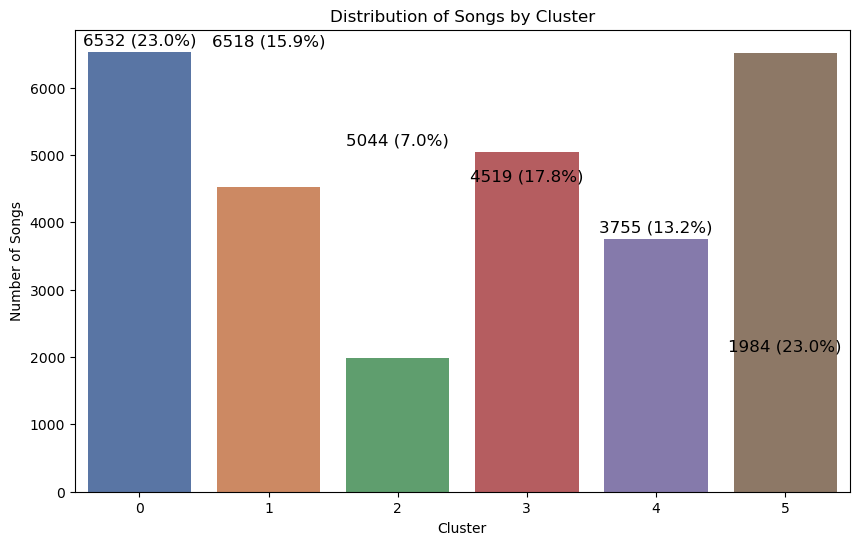

In [213]:
# Count of songs in each cluster
cluster_counts = tracks_uniques['Cluster_KMeans'].value_counts().sort_values(ascending=False)

# Calculate the percentage of each cluster
total_songs = cluster_counts.sum()
cluster_percentages = (cluster_counts / total_songs) * 100

# Plot the distribution of clusters with percentages
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='deep')
plt.xlabel('Cluster')
plt.ylabel('Number of Songs')
plt.title('Distribution of Songs by Cluster')

# Adding data labels on top of bars
for index, value in enumerate(cluster_counts):
    plt.text(index, value + 100, f'{value} ({cluster_percentages[index]:.1f}%)', ha='center', fontsize=12)

plt.grid(False)
plt.show()

In [214]:
# 5. Fonction de recommandation basée sur le clustering KMeans
def recommend_songs_by_cluster(song_name, data, model):
    selected_song = data[data['track_name'].str.contains(song_name, case=False, na=False)]

    if selected_song.empty:
        print("Chanson non trouvée")
        return None
    
    cluster = selected_song[model].values[0]

    recommended_songs = data[data[model] == cluster]
    recommended_songs = recommended_songs[recommended_songs['track_name'] != selected_song['track_name'].values[0]]

    return recommended_songs[['track_name', 'track_artist']].head(10)

In [215]:
track_name_example_kmeans = "Shape of You"
recommendations_kmeans = recommend_songs_by_cluster(track_name_example_kmeans, tracks_uniques, "Cluster_KMeans")

if recommendations_kmeans is not None:
    print("Recommandations :")
    print(recommendations_kmeans)

Recommandations :
                                            track_name    track_artist
10   Cross Me (feat. Chance the Rapper & PnB Rock) ...      Ed Sheeran
35   Love Me Less (feat. Quinn XCII) - Party Pupils...             MAX
36                         Happier - Matt Medved Remix      Marshmello
65                               Talk - Disclosure VIP          Khalid
66                              Spicy - Majestic Remix     Herve Pagez
74                                             Sixteen  Ellie Goulding
77                           I Miss Myself (with HRVY)            NOTD
94                                              Harder       Jax Jones
103                                 Lovers + Strangers         Starley
114                                             Ritual          Tiësto


### DBSCAN

In [216]:
# DBSCAN
dbscan = DBSCAN(eps=1.5, min_samples=10)
dbscan_labels = dbscan.fit_predict(reduced_data)
dbscan_silhouette = silhouette_score(reduced_data, dbscan_labels) if len(set(dbscan_labels)) > 1 else -1
print(f"DBSCAN Silhouette Score: {dbscan_silhouette}")

# Ajouter les clusters aux données
tracks_uniques["DBSCAN_Cluster"] = dbscan_labels

DBSCAN Silhouette Score: 0.76092419545053


C:\Users\Oussama\AppData\Local\Temp\ipykernel_1800\2071655023.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



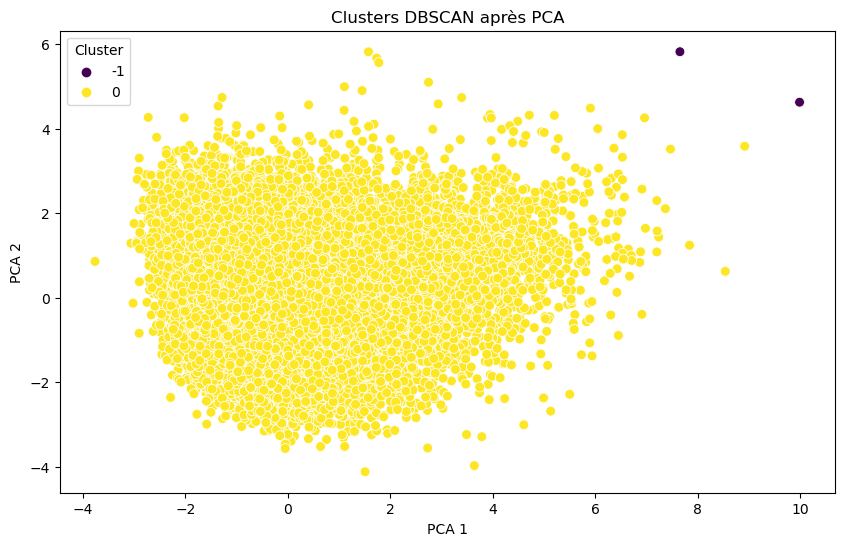

In [217]:
pca = PCA(n_components=2)
data_pca = pca.fit_transform(tracks_scaled)

# Visualisation des clusters DBSCAN
plt.figure(figsize=(10, 6))
sns.scatterplot(x=data_pca[:, 0], y=data_pca[:, 1], hue=dbscan_labels, palette='viridis', s=50)
plt.title("Clusters DBSCAN après PCA")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend(title="Cluster")
plt.show()

In [218]:
def recommend_songs(song_id, cluster_labels, data):
    cluster = cluster_labels[song_id]
    recommendations = data[data["DBSCAN_Cluster"] == cluster].sample(5)
    return recommendations[["track_name", "track_artist", "playlist_genre"]]

# Tester une recommandation
song_id = 10
print(recommend_songs(song_id, dbscan_labels, tracks_uniques))

                        track_name   track_artist playlist_genre
25408             Wake Up This Day      Tom Misch            r&b
3892                       Move On         ayokay            pop
24227                Love No Limit  Mary J. Blige            r&b
6175                     Calm Down         G-Eazy            rap
12576  Somebody To Love - 2011 Mix          Queen           rock


In [219]:
def recommend_songs_by_genre(song_id, data, cluster_labels):
    selected_song = data.iloc[song_id]
    cluster = cluster_labels[song_id]
    genre = selected_song["playlist_genre"]
    
    recommendations = data[
        (data["DBSCAN_Cluster"] == cluster) & (data["playlist_genre"] == genre)
    ].sample(5)
    
    return recommendations[["track_name", "track_artist", "playlist_genre"]]

print(recommend_songs_by_genre(10, tracks_uniques, dbscan_labels))

                                       track_name  track_artist playlist_genre
96                                         Wanted          NOTD            pop
249                   I Miss Myself - R3HAB Remix          NOTD            pop
2797  Casan (No Puedo Bloquear Lo Que Quiero Dar)  Javiera Mena            pop
3719                  Reflections - Gryffin Remix   MisterWives            pop
4575                 Let Me Hold You (Turn Me On)   Cheat Codes            pop


### Gaussian Mixture Model (GMM)

In [388]:
features = tracks_for_clustering
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

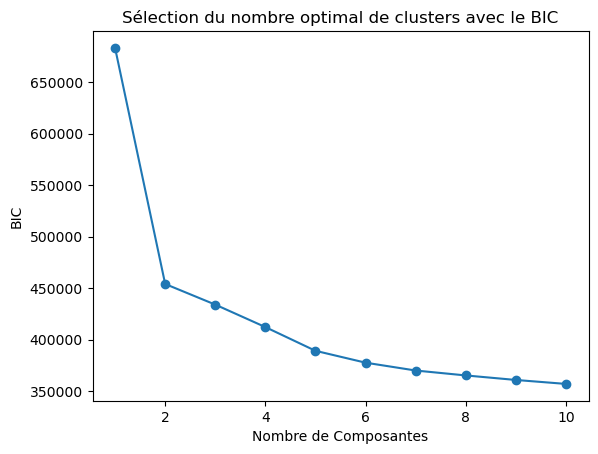

In [389]:
bic_scores = []
n_components_range = range(1, 11)

for n in n_components_range:
    gmm_model = GaussianMixture(n_components=n, random_state=42)
    gmm_model.fit(scaled_features)
    bic_scores.append(gmm_model.bic(scaled_features))

# Visualiser le BIC pour chaque nombre de composantes
plt.plot(n_components_range, bic_scores, marker='o')
plt.xlabel('Nombre de Composantes')
plt.ylabel('BIC')
plt.title('Sélection du nombre optimal de clusters avec le BIC')
plt.show()

# Choisir le nombre de composantes avec le BIC le plus bas
best_n_components = n_components_range[bic_scores.index(min(bic_scores))]

In [390]:
# Ajuster le modèle GMM avec le meilleur nombre de clusters
gmm = GaussianMixture(n_components=best_n_components, random_state=42)
gmm.fit(scaled_features)
clusters_gmm = gmm.predict(scaled_features)
tracks_uniques['Cluster_gmm'] = clusters_gmm

In [391]:
# Générer des recommandations
track_name_example = "Shape of You"
recommendations_gmm = recommend_songs_by_cluster(track_name_example, tracks_uniques, "Cluster_gmm")

if recommendations_gmm is not None:
    print("Recommandations :")
    print(recommendations_gmm)

Recommandations :
                                           track_name      track_artist
0   I Don't Care (with Justin Bieber) - Loud Luxur...        Ed Sheeran
6                     Never Really Over - R3HAB Remix        Katy Perry
11                              Hate Me - R3HAB Remix    Ellie Goulding
23       Slow Dance (feat. Ava Max) - Sam Feldt Remix       AJ Mitchell
36                        Happier - Matt Medved Remix        Marshmello
52                        Old Town Road - Diplo Remix         Lil Nas X
54     Promises (with Sam Smith) - David Guetta Remix     Calvin Harris
57                                          Cool Kids           Olympis
79                     Takeaway (feat. Lennon Stella)  The Chainsmokers
80                                       All the Time      Zara Larsson


### Système de recommandation par KNN entre 'Playlists'

In [392]:
# Splitting the dataset into training and testing
train_data, test_data = train_test_split(data, test_size=0.25, random_state=42)

In [393]:
# Converting to numpy matrix interaction_matrix_matrix = interaction_matrix.values
interaction_matrix = train_data.pivot_table(index='playlist_id', columns='track_id', values='track_popularity').fillna(0) 

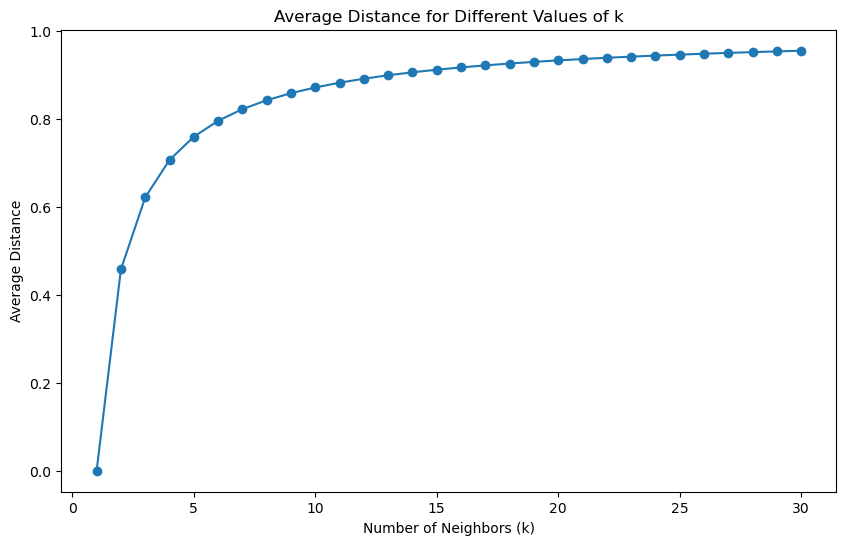

In [394]:
# List of k values to test
k_values = list(range(1, 31))

# Metric to store the results
mean_distances = []

# Loop to find the best k
for k in k_values:
    model = NearestNeighbors(n_neighbors=k, metric='cosine')
    model.fit(interaction_matrix)
    
    # Compute the distances and indices of the nearest neighbors
    distances, indices = model.kneighbors(interaction_matrix)
    
    # Calculate the average distance to the nearest neighbors
    mean_distance = np.mean(distances)
    mean_distances.append(mean_distance)

# Plotting the average distance metric for different values of k
plt.figure(figsize=(10, 6))
plt.plot(k_values, mean_distances, marker='o')
plt.title('Average Distance for Different Values of k')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Average Distance')
plt.grid(False)
plt.show()

# Find the best k (the one that minimizes the average distance)
best_k = k_values[np.argmin(mean_distances)]

In [395]:
# Adjusting k to test a larger value 
model = NearestNeighbors(n_neighbors=best_k, metric='cosine')
model.fit(interaction_matrix)

NearestNeighbors(metric='cosine', n_neighbors=1)

In [396]:
default_song_name = "Shape of you"  

def recommend_songs(df, model, interaction_matrix, song_name = default_song_name, k=10):
    # Find the playlist(s) that contain the predefined song
    song_playlists = df[df['track_name'].str.contains(song_name, case=False, na=False)]['playlist_id'].unique()
    
    if len(song_playlists) == 0:
        print("Song not found in the dataset.")
        return
    
    # Get the index of the first playlist where the song was found
    playlist_id = song_playlists[0]
    
    # Get unique playlist IDs and their corresponding indices in interaction_matrix
    unique_playlists = df['playlist_id'].unique()
    
    if playlist_id not in unique_playlists:
        print("Playlist ID not found in unique playlists.")
        return
    
    playlist_index = np.where(unique_playlists == playlist_id)[0][0]
    
    # Find similar playlists using KNN
    try:
        # If interaction_matrix is a DataFrame, use .iloc to get the row
        if isinstance(interaction_matrix, pd.DataFrame):
            distances, indices = model.kneighbors(interaction_matrix.iloc[playlist_index].values.reshape(1, -1), n_neighbors=k+1)
        else:
            distances, indices = model.kneighbors(interaction_matrix[playlist_index].reshape(1, -1), n_neighbors=k+1)
    except IndexError:
        print("Playlist index is out of bounds in the interaction matrix.")
        return
    
    # Remove the index of the original playlist
    similar_playlists = indices.flatten()[1:]  # Ignoring the first one, which is the original playlist
    
    # Identify songs to recommend
    original_playlist_tracks = set(df[df['playlist_id'] == playlist_id]['track_id'])
    recommended_tracks = set()

    for idx in similar_playlists:
        similar_playlist_id = unique_playlists[idx]
        similar_playlist_tracks = set(df[df['playlist_id'] == similar_playlist_id]['track_id'])
        recommended_tracks.update(similar_playlist_tracks - original_playlist_tracks)

    # Display the recommended songs
    if recommended_tracks:
        recommended_tracks_info = df[df['track_id'].isin(recommended_tracks)][['track_name', 'track_artist']].drop_duplicates()
        print("Recommended songs")
        print(recommended_tracks_info)
    else:
        print("No new songs to recommend.")

In [397]:
# Example usage
print("Música selecionada", default_song_name)
recommend_songs(data, model, interaction_matrix)

Música selecionada Shape of you
Recommended songs
                                              track_name    track_artist
142                                                Light        San Holo
151    Stay The Night - Featuring Hayley Williams Of ...            Zedd
156                                           Wake Me Up          Avicii
317                   Without You (feat. Sandro Cavazza)          Avicii
318                       Call On Me - Ryan Riback Remix         Starley
...                                                  ...             ...
31859                            You're Gonna Love Again           NERVO
31860                                       Burn - Remix  Ellie Goulding
31864               Escape (Into The Sunset) - Radio Mix        Quintino
31865                  Move To The Rhythm - Original Mix          Tiësto
31866                                               Epic    Sandro Silva

[668 rows x 2 columns]


C:\Users\Oussama\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but NearestNeighbors was fitted with feature names



### Prediction Spotify Music avec XGBoost

In [398]:
features = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
            'duration_ms']

In [399]:
target_column = 'playlist_genre'

# Creating feature set and target variable
X = data[features]
y = data[target_column]

# Encoding the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [400]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Define the hyperparameters and values to test
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.1, 0.01, 0.001],
}

In [401]:
# Create a GridSearchCV instance for XGBoost
grid_search_xgb = GridSearchCV(XGBClassifier(random_state=42), param_grid_xgb, cv=3, scoring='accuracy')

# Fit the grid search to the data
grid_search_xgb.fit(X_train, y_train)

# Get the best parameters and best estimator for XGBoost
best_params_xgb = grid_search_xgb.best_params_
best_estimator_xgb = grid_search_xgb.best_estimator_

In [402]:
# Use the best estimator for prediction and evaluation
y_pred_best_xgb = best_estimator_xgb.predict(X_test)
accuracy_best_xgb = metrics.accuracy_score(y_test, y_pred_best_xgb)

print("Best Parameters for XGBoost:", best_params_xgb)
print("Accuracy with Best XGBoost Estimator:", accuracy_best_xgb)

Best Parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}
Accuracy with Best XGBoost Estimator: 0.5572646969235455


# Collaborative Filtering

In [403]:
from sklearn.metrics.pairwise import cosine_similarity

In [404]:
dupes.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
5,7fvUMiyapMsRRxr07cU8Ef,Beautiful People (feat. Khalid) - Jack Wins Remix,Ed Sheeran,67,2yiy9cd2QktrNvWC2EUi0k,Beautiful People (feat. Khalid) [Jack Wins Remix],2019-07-11,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,8,-5.385,1,0.1270,0.0799,0.000000,0.1430,0.585,124.982,163049
7,6b1RNvAcJjQH73eZO4BLAB,Post Malone (feat. RANI) - GATTÜSO Remix,Sam Feldt,69,6703SRPsLkS4bPtMFFJes1,Post Malone (feat. RANI) [GATTÜSO Remix],2019-08-29,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,4,-2.419,0,0.0434,0.0335,0.000005,0.1110,0.367,127.936,207619


In [405]:
counts = dupes['track_id'].value_counts()
counts

7BKLCZ1jbUBVqRi2FVlTVw    9
14sOS5L36385FJ3OL8hew4    8
3eekarcy7kvN4yt5ZFzltW    8
3ZCTVFBt2Brf31RLEnCkWJ    7
6oJ6le65B3SEqPwMRNXWjY    7
                         ..
3jagJCUbdqhDSPuxP8cAqF    1
0NTMtAO2BV4tnGvw9EgBVq    1
6l4qV9VNeCOesvcLPJMO9y    1
33ZXjLCpiINn8eQIDYEPTD    1
2sApUgcQQL2m0quuYgq0ec    1
Name: track_id, Length: 3165, dtype: int64

In [406]:
track_ids_to_keep = counts[counts >= 5].index
track_ids_to_keep

Index(['7BKLCZ1jbUBVqRi2FVlTVw', '14sOS5L36385FJ3OL8hew4',
       '3eekarcy7kvN4yt5ZFzltW', '3ZCTVFBt2Brf31RLEnCkWJ',
       '6oJ6le65B3SEqPwMRNXWjY', '7h0d2h0fUmzbs7zeFigJPn',
       '0rIAC4PXANcKmitJfoqmVm', '6wo37KVqFJhtuxPTpLCcfe',
       '56AMYGJzxBO6p8v0wEe9de', '0qaWEvPkts34WF68r8Dzx9',
       '6WrI0LAC5M1Rw2MnX2ZvEg', '0nbXyq5TXYPCO7pr3N8S4I',
       '7LzouaWGFCy4tkXDOOnEyM', '2Fxmhks0bxGSBdJ92vM42m',
       '2tnVG71enUj33Ic2nFN6kZ', '0sf12qNH5qcw8qpgymFOqD',
       '2b8fOow8UzyDFAE27YhOZM', '6Gg1gjgKi2AK4e0qzsR7sd',
       '1ZPWWSwCkxKfqdp4H0RFCo', '7k4t7uLgtOxPwTpFmtJNTY',
       '41L3O37CECZt3N7ziG2z7l', '5N4erncE7kuUccm7zEmwzk',
       '6LcauUZjF1eXQrgqMUecHX', '51Fjme0JiitpyXKuyQiCDo',
       '3yOlyBJuViE2YSGn3nVE1K', '0TK2YIli7K1leLovkQiNik',
       '6cy3ki60hLwimwIje7tALf', '6mAN61JH0dzyZpWslS11jy',
       '5ry2OE6R2zPQFDO85XkgRb', '7aiClxsDWFRQ0Kzk5KI5ku',
       '7CHi4DtfK4heMlQaudCuHK', '5yY9lUy8nbvjM1Uyo1Uqoc',
       '2ksOAxtIxY8yElEWw8RhgK', '1HfMVBKM75vxSfsQ5VefZ5

In [407]:
track_ids_to_keep.shape

(70,)

In [408]:
filtered_dupes = dupes[dupes['track_id'].isin(track_ids_to_keep)]
filtered_dupes

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
41,6oJ6le65B3SEqPwMRNXWjY,Higher Love,Kygo,87,4wquJImu8RtyEuDtIAsfcE,Higher Love,2019-06-28,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,8,-7.159,1,0.0324,0.0154,0.000006,0.1010,0.404,103.952,228267
79,6wo37KVqFJhtuxPTpLCcfe,Takeaway (feat. Lennon Stella),The Chainsmokers,67,1JawI0XkEwmQ5Bwef3RMbq,World War Joy...Takeaway,2019-07-24,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,...,3,-8.106,1,0.0420,0.1200,0.000000,0.0977,0.357,85.332,209893
95,09IStsImFySgyp0pIQdqAc,The Middle,Zedd,84,7nEiwcUSwycvC77kZ9ub7c,The Middle,2018-01-23,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,...,7,-3.061,1,0.0449,0.1710,0.000000,0.1120,0.437,107.010,184732
100,5WHTFyqSii0lmT9R21abT8,Don't Call Me Up,Mabel,85,0syM7OUAhV7S6XmOa4nLUZ,Ivy To Roses (Mixtape),2019-01-18,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,...,9,-2.853,1,0.1470,0.2960,0.000003,0.0793,0.234,98.994,178480
108,1ahVFh0ViDZr8LvkEVlq3B,No Sleep (feat. Bonn),Martin Garrix,76,7KJTuTXYSnBGNgAxte3CSg,No Sleep (feat. Bonn),2019-02-21,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,...,11,-6.385,1,0.0326,0.1290,0.000000,0.1210,0.327,128.133,207095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28846,6oJ6le65B3SEqPwMRNXWjY,Higher Love,Kygo,87,4wquJImu8RtyEuDtIAsfcE,Higher Love,2019-06-28,Dancefloor Beats,6mMk6QCzEgT3QGaCV1R4S5,edm,...,8,-7.159,1,0.0324,0.0154,0.000006,0.1010,0.404,103.952,228267
29144,0qaWEvPkts34WF68r8Dzx9,Turn Me On (feat. Vula),Riton,86,7mtnp7B5yFt3D3PAznGzc8,Turn Me On (feat. Vula),2019-09-13,Trance Party 2019 by FUTURE TRANCE,2yofeyPwe0ZNmJHTrGz2Qt,edm,...,11,-4.711,1,0.0396,0.0149,0.000583,0.0862,0.517,124.052,208474
29198,2V65y3PX4DkRhy1djlxd9p,Don't You Worry Child - Radio Edit,Swedish House Mafia,77,3RKhRsifs4RWrqvWV1YpPY,Don't You Worry Child,2012-09-14,Trance Party 2019 by FUTURE TRANCE,2yofeyPwe0ZNmJHTrGz2Qt,edm,...,11,-3.145,0,0.0509,0.1120,0.000000,0.1160,0.438,129.042,212862
29302,1ahVFh0ViDZr8LvkEVlq3B,No Sleep (feat. Bonn),Martin Garrix,76,7KJTuTXYSnBGNgAxte3CSg,No Sleep (feat. Bonn),2019-02-21,Big Room House,7vJOXFe40axY7qS39vGDyH,edm,...,11,-6.385,1,0.0326,0.1290,0.000000,0.1210,0.327,128.133,207095


In [409]:
filtered_dupes = filtered_dupes[['track_id', 'playlist_id']]
filtered_dupes

,track_id,playlist_id
41,6oJ6le65B3SEqPwMRNXWjY,37i9dQZF1DXcZDD7cfEKhW
79,6wo37KVqFJhtuxPTpLCcfe,37i9dQZF1DWZQaaqNMbbXa
95,09IStsImFySgyp0pIQdqAc,37i9dQZF1DWZQaaqNMbbXa
100,5WHTFyqSii0lmT9R21abT8,37i9dQZF1DWZQaaqNMbbXa
108,1ahVFh0ViDZr8LvkEVlq3B,37i9dQZF1DWZQaaqNMbbXa
...,...,...
28846,6oJ6le65B3SEqPwMRNXWjY,6mMk6QCzEgT3QGaCV1R4S5
29144,0qaWEvPkts34WF68r8Dzx9,2yofeyPwe0ZNmJHTrGz2Qt
29198,2V65y3PX4DkRhy1djlxd9p,2yofeyPwe0ZNmJHTrGz2Qt
29302,1ahVFh0ViDZr8LvkEVlq3B,7vJOXFe40axY7qS39vGDyH


### Collaboration Matrix

In [410]:
collab_matrix = pd.crosstab(filtered_dupes['track_id'], filtered_dupes['playlist_id'])
collab_matrix

playlist_id,0B2HdP15IucgE0vk3sluJR,0BwUQpqHSlC2YfKwOp2dQV,0Hr2h94pKN8QAGVAgD6BsD,0UXwwVDipbBQeEX7h4YuKU,0VsVywryrqLhHmsVFVcOAg,0cuHKz65ZPqBX1brG8djlg,0vbtbmyihyvl2MVYrdKdGw,10FCW9lj0NdeoYI5VVvVtY,1CMvQ4Yr5DlYvYzI0Vc2UE,1KNl4AYfgZtOVm9KHkhPTF,...,6mMk6QCzEgT3QGaCV1R4S5,6mXh8CUBMBsBUu88a4eAQV,6wyJ4bsjZaUKa9f6GeZlAO,7ENISpOJhocpMJVcGb0qcT,7FqZlaYKkQmVnguJbHuj2a,7kyvBmlc1uSqsTL0EuNLrx,7kzKtw5vug3IIxKfLadi8A,7tkgK1tm9hYkWp7EFyOcAr,7vJOXFe40axY7qS39vGDyH,7xWuNevFBmwnFEg6wzdCc7
track_id,,,,,,,,,,,,,,,,,,,,,
09IStsImFySgyp0pIQdqAc,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0TK2YIli7K1leLovkQiNik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0azC730Exh71aQlOt9Zj3y,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
0bMbDctzMmTyK2j74j3nF3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0fea68AdmYNygeTGI4RC18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7aiClxsDWFRQ0Kzk5KI5ku,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7ef4DlsgrMEH11cDZd32M6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7h0d2h0fUmzbs7zeFigJPn,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [411]:
similarity_matrix = cosine_similarity(collab_matrix)
similarity_matrix

array([[1.        , 0.        , 0.2       , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 1.        , 0.        , ..., 0.47140452, 0.14433757,
        0.6681531 ],
       [0.2       , 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.47140452, 0.        , ..., 1.        , 0.13608276,
        0.62994079],
       [0.        , 0.14433757, 0.        , ..., 0.13608276, 1.        ,
        0.3086067 ],
       [0.        , 0.6681531 , 0.        , ..., 0.62994079, 0.3086067 ,
        1.        ]])

### Similarity Matrix

In [412]:
similarity_df = pd.DataFrame(similarity_matrix, index=collab_matrix.index, columns=collab_matrix.index)
similarity_df

track_id,09IStsImFySgyp0pIQdqAc,0TK2YIli7K1leLovkQiNik,0azC730Exh71aQlOt9Zj3y,0bMbDctzMmTyK2j74j3nF3,0fea68AdmYNygeTGI4RC18,0hVXuCcriWRGvwMV1r5Yn9,0nbXyq5TXYPCO7pr3N8S4I,0qaWEvPkts34WF68r8Dzx9,0rIAC4PXANcKmitJfoqmVm,0sf12qNH5qcw8qpgymFOqD,...,7BKLCZ1jbUBVqRi2FVlTVw,7BlBVFwvbWvcwNcUarQmjk,7CHi4DtfK4heMlQaudCuHK,7HMmFQsKsljwTw8bS7lu19,7LzouaWGFCy4tkXDOOnEyM,7aiClxsDWFRQ0Kzk5KI5ku,7ef4DlsgrMEH11cDZd32M6,7h0d2h0fUmzbs7zeFigJPn,7k4t7uLgtOxPwTpFmtJNTY,7qEHsqek33rTcFNT9PFqLf
track_id,,,,,,,,,,,,,,,,,,,,,
09IStsImFySgyp0pIQdqAc,1.0,0.000000,0.2,0.000000,0.000000,0.000000,0.000000,0.124035,0.000000,0.000000,...,0.115470,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.000000,0.000000,0.000000
0TK2YIli7K1leLovkQiNik,0.0,1.000000,0.0,0.639602,0.158114,0.000000,0.471405,0.588348,0.588348,0.707107,...,0.547723,0.000000,0.000000,0.625000,0.588348,0.500000,0.158114,0.471405,0.144338,0.668153
0azC730Exh71aQlOt9Zj3y,0.2,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.124035,0.000000,0.000000,...,0.230940,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000
0bMbDctzMmTyK2j74j3nF3,0.0,0.639602,0.0,1.000000,0.000000,0.000000,0.603023,0.836242,0.836242,0.703526,...,0.700649,0.000000,0.123091,0.639602,0.836242,0.746203,0.000000,0.603023,0.000000,0.683763
0fea68AdmYNygeTGI4RC18,0.0,0.158114,0.0,0.000000,1.000000,0.200000,0.000000,0.000000,0.124035,0.149071,...,0.000000,0.400000,0.182574,0.000000,0.124035,0.158114,0.000000,0.000000,0.365148,0.338062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7aiClxsDWFRQ0Kzk5KI5ku,0.0,0.500000,0.0,0.746203,0.158114,0.316228,0.589256,0.686406,0.784465,0.589256,...,0.547723,0.158114,0.288675,0.500000,0.784465,1.000000,0.000000,0.589256,0.144338,0.801784
7ef4DlsgrMEH11cDZd32M6,0.4,0.158114,0.2,0.000000,0.000000,0.000000,0.000000,0.124035,0.000000,0.149071,...,0.230940,0.000000,0.000000,0.158114,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
7h0d2h0fUmzbs7zeFigJPn,0.0,0.471405,0.0,0.603023,0.000000,0.149071,1.000000,0.554700,0.554700,0.444444,...,0.516398,0.000000,0.000000,0.471405,0.554700,0.589256,0.000000,1.000000,0.136083,0.629941


### Recommandation

In [413]:
# un track_id présent dans la matrice de similarité
track_id_exemple = '0bMbDctzMmTyK2j74j3nF3'

In [414]:
similar_tracks = similarity_df[track_id].sort_values(ascending=False)
similar_tracks

track_id
0bMbDctzMmTyK2j74j3nF3    1.000000
2plLJpUcYPFrl1sW2pMG63    0.909091
7LzouaWGFCy4tkXDOOnEyM    0.836242
0qaWEvPkts34WF68r8Dzx9    0.836242
0rIAC4PXANcKmitJfoqmVm    0.836242
                            ...   
2V65y3PX4DkRhy1djlxd9p    0.000000
3VyjsVV24RmBIbWJAeUJNu    0.000000
4ut5G4rgB1ClpMTMfjoIuy    0.000000
6Gg1gjgKi2AK4e0qzsR7sd    0.000000
3vv9phIu6Y1vX3jcqaGz5Z    0.000000
Name: 0bMbDctzMmTyK2j74j3nF3, Length: 70, dtype: float64

In [415]:
already_listened = [track_id]
recommendations = similar_tracks[~similar_tracks.index.isin(already_listened)]
recommendations

track_id
2plLJpUcYPFrl1sW2pMG63    0.909091
7LzouaWGFCy4tkXDOOnEyM    0.836242
0qaWEvPkts34WF68r8Dzx9    0.836242
0rIAC4PXANcKmitJfoqmVm    0.836242
3HVWdVOQ0ZA45FuZGSfvns    0.818182
                            ...   
2V65y3PX4DkRhy1djlxd9p    0.000000
3VyjsVV24RmBIbWJAeUJNu    0.000000
4ut5G4rgB1ClpMTMfjoIuy    0.000000
6Gg1gjgKi2AK4e0qzsR7sd    0.000000
3vv9phIu6Y1vX3jcqaGz5Z    0.000000
Name: 0bMbDctzMmTyK2j74j3nF3, Length: 69, dtype: float64

In [416]:
num_recommendations = 5
top_recommendations = recommendations.head(num_recommendations)
top_recommendations

track_id
2plLJpUcYPFrl1sW2pMG63    0.909091
7LzouaWGFCy4tkXDOOnEyM    0.836242
0qaWEvPkts34WF68r8Dzx9    0.836242
0rIAC4PXANcKmitJfoqmVm    0.836242
3HVWdVOQ0ZA45FuZGSfvns    0.818182
Name: 0bMbDctzMmTyK2j74j3nF3, dtype: float64

In [417]:
top_indexes = top_recommendations.index
top_indexes

Index(['2plLJpUcYPFrl1sW2pMG63', '7LzouaWGFCy4tkXDOOnEyM',
       '0qaWEvPkts34WF68r8Dzx9', '0rIAC4PXANcKmitJfoqmVm',
       '3HVWdVOQ0ZA45FuZGSfvns'],
      dtype='object', name='track_id')

In [418]:
filtered_tracks = tracks_uniques[tracks_uniques['track_id'].isin(top_indexes)]
recommanded_songs_by_similarity = filtered_tracks[['track_name', 'track_artist']]

In [419]:
# trouver l'index de la 1ère occurence du track_id voulu dans dupes
matching_indices = tracks_uniques[tracks_uniques['track_id'].isin(top_recommendations.index)].track_id
matching_indices

141     0qaWEvPkts34WF68r8Dzx9
661     0rIAC4PXANcKmitJfoqmVm
1247    7LzouaWGFCy4tkXDOOnEyM
1315    2plLJpUcYPFrl1sW2pMG63
4655    3HVWdVOQ0ZA45FuZGSfvns
Name: track_id, dtype: object

In [420]:
matching_indices.index.tolist()

[141, 661, 1247, 1315, 4655]

In [421]:
clusters_variables = tracks_uniques['Cluster_KMeans'].iloc[matching_indices.index.tolist()]

In [422]:
cluster_cible = clusters_variables.value_counts().index[0]

In [423]:
track_genre_prioritaire = dupes[dupes.track_id == track_id_exemple].playlist_genre.value_counts().index[0]
track_genre_secondaire = dupes[dupes.track_id == track_id_exemple].playlist_genre.value_counts().index[1]

In [424]:
filtered_songs_fist = tracks_uniques[(tracks_uniques['Cluster_KMeans'] == cluster_cible) 
                                     & (tracks_uniques['playlist_genre'].str.lower() == track_genre_prioritaire) 
                                     & (tracks_uniques['track_id'] != track_id_exemple)]
song_recommande_first = filtered_songs_fist.head(4)

In [425]:
filtered_songs_second = tracks_uniques[(tracks_uniques['Cluster_KMeans'] == cluster_cible) 
                                       & (tracks_uniques['playlist_genre'].str.lower() == track_genre_secondaire)
                                       & (tracks_uniques['track_id'] != track_id_exemple)]
song_recommande_second = filtered_songs_second.head(1)

In [426]:
all_recommendations = pd.concat([recommanded_songs_by_similarity, song_recommande_first, song_recommande_second])
all_recommendations_details = all_recommendations[['track_name', 'track_artist']]
all_recommendations_details

,track_name,track_artist
141,Turn Me On (feat. Vula),Riton
661,Motivation,Normani
1247,Liar,Camila Cabello
1315,Lights Up,Harry Styles
4655,I Don't Care (with Justin Bieber),Ed Sheeran
16207,Messiah,Klingande
16208,Never Alone,Felix Jaehn
16210,All or Nothing - Sultan + Shepard Remix,Lost Frequencies
16211,Are You Mine,Alex Schulz
21378,No Denying,J Hus
